## Code for Producing Images in Lecture Notes

In [2]:
import matplotlib.pyplot as plt
import scienceplots

plt.style.use('science')

In [3]:
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits.mplot3d import Axes3D


## Linear Regression Figures

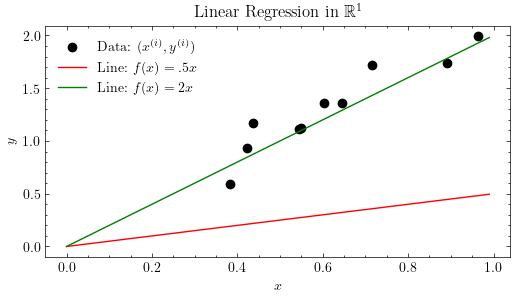

In [4]:
np.random.seed(0) # Seed randomness
plt.figure(figsize=(6, 3))

n = 10 # Number of observations
w = 2 # True parameter
X = np.random.rand(n) # x-values
y = X.dot(w).T + np.random.normal(size=n) * .2 #y-values

plt.scatter(X,y, color='black', label=r'Data: $(x^{(i)}, y^{(i)})$')
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
xaxis = np.arange(0,1,.01)
plt.plot(xaxis, xaxis*.5, label=r'Line: $f(x) = .5x$', color='red')
plt.plot(xaxis, xaxis*w, label=r'Line: $f(x) = 2x$', color='green')
plt.legend()
plt.title(r'Linear Regression in $\mathbb{R}^1$')
plt.savefig('images/regression_1d.svg')

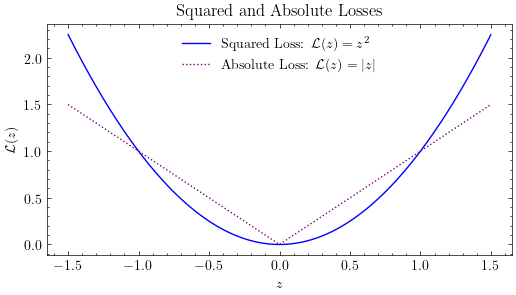

In [5]:
plt.figure(figsize=(6, 3))
plt.xlabel(r'$z$')
plt.ylabel(r'$\mathcal{L}(z)$')
xaxis = np.arange(-1.5,1.5,.001)
plt.plot(xaxis, xaxis**2, label=r'Squared Loss: $\mathcal{L}(z)=z^2$', color='blue')
plt.plot(xaxis, np.abs(xaxis), label=r'Absolute Loss: $\mathcal{L}(z)=|z|$', color='purple', linestyle='dotted')
plt.legend()
plt.title(r'Squared and Absolute Losses')
plt.savefig('images/regression_losses.svg')

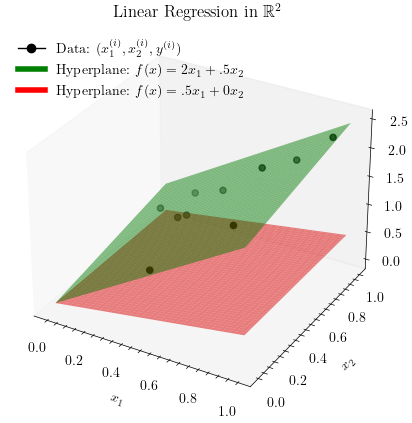

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

# Seed randomness
np.random.seed(1234)
n = 10  # Number of observations
w = np.array([2, .5])  # True parameter
X = np.random.rand(n, 2)  # x-values
y = X.dot(w).T + np.random.normal(size=n) * .1  # y-values

# Create figure and 3D axis
fig = plt.figure(figsize=(5, 5))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot for data points
ax.scatter(X[:, 0], X[:, 1], y, color='black', label=r'Data: $(x_1^{(i)}, x_2^{(i)}, y^{(i)})$')

# Hyperplane 1: Green
x1 = np.arange(0, 1, .01)
x2 = np.arange(0, 1, .01)
X1, X2 = np.meshgrid(x1, x2)
Z = w[0] * X1 + w[1] * X2
ax.plot_surface(X1, X2, Z, alpha=.5, color='green')

# Hyperplane 2: Red
ax.plot_surface(X1, X2, .5 * X1 + 0 * X2, alpha=.5, color='red')

# Labels and title
ax.set_xlabel(r'$x_1$')
ax.set_ylabel(r'$x_2$')
ax.set_zlabel(r'$y$')
ax.set_title(r'Linear Regression in $\mathbb{R}^2$')
ax.grid(False)

# Manually create custom legend handles for the surfaces
handles = [
    Line2D([0], [0], marker='o', color='black', markerfacecolor='black', markersize=6, label=r'Data: $(x_1^{(i)}, x_2^{(i)}, y^{(i)})$'),
    Line2D([0], [0], color='green', lw=4, label=r'Hyperplane: $f(x) = 2x_1 + .5x_2$'),
    Line2D([0], [0], color='red', lw=4, label=r'Hyperplane: $f(x) = .5x_1 + 0x_2$')
]

# Add legend
plt.legend(handles=handles, loc='upper left', framealpha=1)

# Save the figure
plt.savefig('images/regression_2d.svg', bbox_inches='tight')
plt.show()


## Non-linear Regression Figures

/opt/homebrew/Caskroom/miniconda/base/envs/rads/lib/python3.10/site-packages/torch/functional.py:554: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /Users/runner/work/pytorch/pytorch/pytorch/aten/src/ATen/native/TensorShape.cpp:4316.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


<Figure size 400x200 with 0 Axes>

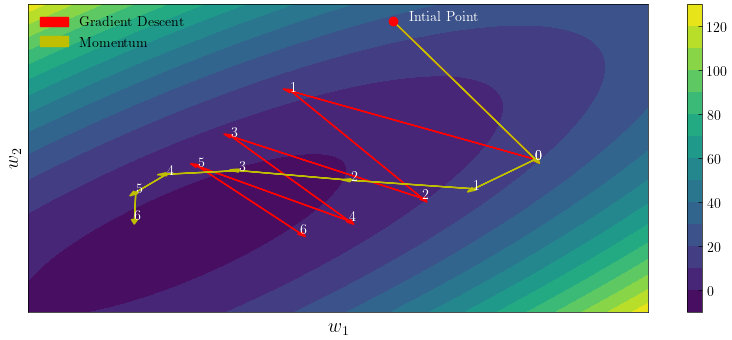

In [7]:
## Gradient descent

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib import cm
import torch

%matplotlib inline

class QuadFunc:
  def __init__(self, a, b, c, d, e):
    self.a = a
    self.b = b
    self.c = c
    self.d = d
    self.e = e

  def getParams(self, x, y):
    if y is None:
      y = x[1]
      x = x[0]
    return x,y

  def __call__(self, x, y=None):
    x,y = self.getParams(x,y)
    return 0.5 * (self.a*x**2 + self.b*y**2) + self.c * x * y + self.d * x + self.e * y

  def grad(self, x, y=None):
    #df/dx = ax + cy + d
    #df/dy = by + cx + e
    x,y = self.getParams(x,y)
    return torch.tensor([self.a * x + self.c * y + self.d, self.b * y + self.c * x + self.e])

  def hess(self, x, y=None):
    #d2f/dx2 = a
    #d2f/dy2 = b
    #d2f/dxdy = c
    #d2f/dydx = c
    x, y = self.getParams(x,y)
    return torch.tensor([[self.a, self.c], [self.c, self.b]])

class GradientDescent:
    def __init__(self, lr=1, b1=0.9, b2=0.999):
        # b1 -> Momentum
        # b2 -> ADAM
        # ADAM Paper -> https://arxiv.org/abs/1412.6980
        self.lr = lr # learning rate
        self.b1 = b1 # grad aggregation param (for Momentum)
        self.b2 = b2 # grad^2 aggregation param (for ADAM)

        self.v = 0 # grad aggregation param
        self.w = 0 # grad^2 aggregation param
        self.t = 0

        self.eps = 1e-9

    def __call__(self, grad,hess):

        self.t += 1


        # aggregation
        self.v = self.b1*self.v + (1-self.b1)*grad
        self.w = self.b2*self.w + (1-self.b2)*grad**2

        # bias correction
        vcorr = self.v/(1-self.b1**self.t)
        wcorr = self.w/(1-self.b2**self.t) if self.b2 != 0 else 1

        return -1*self.lr*vcorr/(wcorr**0.5 + self.eps)

class Newtons:
    # https://en.wikipedia.org/wiki/Newton%27s_method_in_optimization
    def __init__(self, lr=1):
        self.lr = lr

    def __call__(self,grad,hess):
        return -1*self.lr*torch.matmul(torch.inverse(hess), grad)

def runOptim(init,optim,func,steps):

    curpos = init # current position
    path = [curpos]


    for _ in range(steps):

        grad = func.grad(curpos)
        hess = func.hess(curpos)

        dx = optim(grad,hess)
        curpos = curpos + dx
        path.append(curpos)

    return path


def showPath(func,init,paths,labels,colors,levels):

    x = torch.arange(-10,10,0.05)
    y = torch.arange(-10,10,0.05)

    # create meshgrid
    xx, yy = torch.meshgrid(x,y)
    zz = func(xx,yy)

    # create contour
    fig, ax = plt.subplots(1,1,figsize=(10,4))
    cp = ax.contourf(xx,yy,zz,levels)
    fig.colorbar(cp)

    # mark initial point
    ax.plot(init[0],init[1],'ro')
    ax.text(init[0]+0.5,init[1],'Intial Point',color='white')

    # Plot paths
    for pnum in range(len(paths)):
        for i in range(len(paths[pnum])-1):
            curpos = paths[pnum][i]
            d = paths[pnum][i+1] - curpos
            ax.arrow(curpos[0],curpos[1],d[0],d[1],color=colors[pnum],head_width=0.2)
            ax.text(curpos[0]+d[0],curpos[1]+d[1],str(i),color='white')

    # Add legend
    legends = []
    for col in colors:
        legends.append(mpatches.Patch(color=col))
    # Put legend in top left corner
    ax.legend(legends,labels, loc='upper left')


plt.figure(figsize=(4, 2))
a = 1/torch.sqrt(torch.tensor(2.0))
init = torch.matmul(torch.tensor([[a,a],[-a,a]]),torch.tensor([-5.0,7.5]))
ell = QuadFunc(a,a,-0.8*a,a,a)
steps = 7
lr = 1.5
regGD = GradientDescent(lr,0,0) # Without Momentum
momGD = GradientDescent(lr,0.9,0) # Momentum
path1 = runOptim(init,regGD,ell,steps)
path2 = runOptim(init,momGD,ell,steps)
# Set figure size
showPath(ell,init,[path1,path2],['Gradient Descent','Momentum'],['r','y'], 15)
# Turn off axis ticks
plt.xticks([])
plt.yticks([])
plt.xlabel(r'$w_1$', fontsize=14)
plt.ylabel(r'$w_2$', fontsize=14)
plt.savefig('images/regression_momentum.svg', bbox_inches='tight', dpi=300)

[-0.15312242]
[-0.40540951 -0.15312242  0.99509606]
[  -0.52284668   -3.01040003    5.89533097   38.37227831  -23.76167019
 -158.37031364   25.43098462  242.78437408   11.69445087 -119.9112841
  -18.07379656]


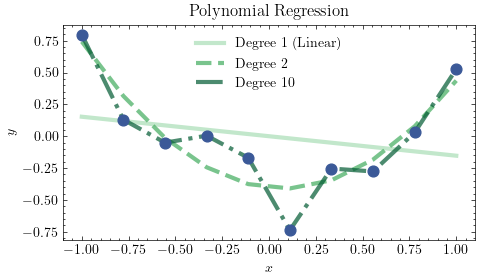

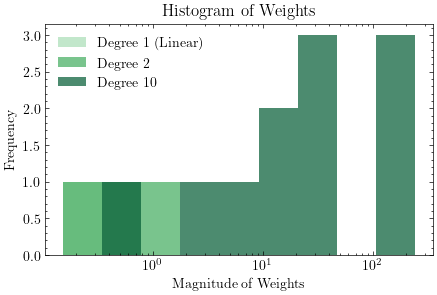

In [8]:
import numpy as np
import matplotlib.pyplot as plt

# Step 1: Generate noisy linear data
n = 10 # Number of observations
np.random.seed(0)
X = np.linspace(-1, 1, n).reshape(-1, 1)
noise = .2 * np.random.normal(0, 1, n).reshape(-1, 1)  # Gaussian noise
y = X**2 + noise
y -= np.mean(y)
y = y.ravel()

y_preds = {}
weight_cache = {}

# Step 2: Fit linear regression model
weights = np.linalg.lstsq(X, y, rcond=None)[0]  # Get weights from least squares solution
y_preds['Degree 1 (Linear)'] = X.dot(weights).ravel()  # Recompute predictions using weights
weight_cache['Degree 1 (Linear)'] = weights

for power in [3, 11]:
    X_powers = X ** np.arange(0, power)
    weights = np.linalg.lstsq(X_powers, y, rcond=None)[0]
    y_preds[f'Degree {power-1}'] = X_powers.dot(weights).ravel()
    weight_cache[f'Degree {power-1}'] = weights    

# Step 4: Plotting
plt.figure(figsize=(5, 3))

linestyles = ['-', '--', '-.']

colors = ['#a8ddb5', '#41ab5d', '#005a32']

for idx, (label, y_pred) in enumerate(y_preds.items()):
    plt.plot(X, y_pred, label=label, linewidth=3, alpha=0.7, zorder=1, linestyle=linestyles[idx], color=colors[idx])

plt.scatter(X, y, marker='o', color='#3B5998', s=60, zorder=2)  # Deep Cornflower Blue

plt.legend()
plt.title('Polynomial Regression')
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.tight_layout()
plt.savefig('images/regression_polynomial.svg', bbox_inches='tight', dpi=300)


fig, ax = plt.subplots(figsize=(5, 3))

# collect global min>0 and max across both sets
all_abs = np.concatenate([np.abs(w) for w in weight_cache.values()])
min_pos = np.min(all_abs[all_abs > 0])
bins = np.logspace(np.log10(min_pos), np.log10(all_abs.max()), 10)

for idx, (label, weights) in enumerate(weight_cache.items()):
    print(weights)

    ax.hist(np.abs(weights), bins=bins, alpha=0.7, label=label, color=colors[idx])  # density=True for shape comparison

ax.set_xscale('log')
ax.set_xlabel('Magnitude of Weights')
ax.set_ylabel('Frequency')
ax.set_title('Histogram of Weights')
ax.legend()
plt.savefig('images/regression_polynomial_weights.svg', bbox_inches='tight', dpi=300)

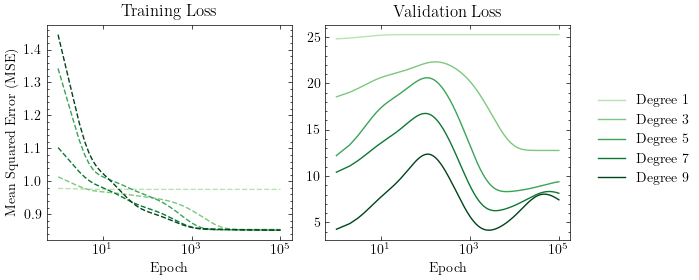

In [9]:
# Loss curves

n = 100 # Number of observations
np.random.seed(0)
X = np.linspace(0, 1, n).reshape(-1, 1)
noise = np.random.normal(0, 1, n).reshape(-1, 1)  # Gaussian noise
X_powers = X ** np.arange(0, 20)
y = X_powers.dot(np.random.rand(20, 1)) + noise - np.mean(noise)  # Center noise
y = y.ravel()

X_train, y_train = X[:80], y[:80]
X_val, y_val = X[80:], y[80:]
lr = .1

degrees = list(range(1, 11, 2))  # [1, 5, 10]

weights_by_degree = {degree : np.random.rand(degree) for degree in degrees}

loss_test = {degree : [] for degree in degrees}
loss_train = {degree : [] for degree in degrees}

for epoch in range(100000):
    for degree, weights in weights_by_degree.items():
        X_train_powers = X_train ** np.arange(0, degree)
        y_train_pred = X_train_powers.dot(weights).ravel()
        train_loss = np.mean((y_train - y_train_pred) ** 2)
        loss_train[degree].append(train_loss)

        X_val_powers = X_val ** np.arange(0, degree)
        y_val_pred = X_val_powers.dot(weights).ravel()
        val_loss = np.mean((y_val - y_val_pred) ** 2)
        loss_test[degree].append(val_loss)

        gradient = -2 * X_train_powers.T.dot(y_train - y_train_pred) / len(y_train)
        weights -= lr * gradient
        weights_by_degree[degree] = weights

# x positions for log-scale (start at 1, not 0)
epochs = np.arange(1, len(next(iter(loss_train.values()))) + 1)

# Different vertical scales: remove sharey
fig, (ax_tr, ax_val) = plt.subplots(1, 2, figsize=(7, 3))

# Green shades by degree (darker = larger degree)
cmap = plt.cm.Greens
dmin, dmax = min(degrees), max(degrees)
def green_for_degree(d):
    # map degree -> [0.3, 1.0] so the lightest line is still visible
    t = 0.0 if dmax == dmin else (d - dmin) / (dmax - dmin)
    t = 0.3 + 0.7 * t
    return cmap(t)

for degree in degrees:
    c = green_for_degree(degree)
    ax_tr.plot(epochs, loss_train[degree], linestyle='--', color=c)
    ax_val.plot(epochs, loss_test[degree], label=f'Degree {degree}', linestyle='-', color=c)

for ax, title in [(ax_tr, 'Training Loss'), (ax_val, 'Validation Loss')]:
    ax.set_xscale('log')
    ax.set_xlabel('Epoch')
    ax.set_title(title)

ax_tr.set_ylabel('Mean Squared Error (MSE)')
# Single legend for the whole figure, outside the plots
fig.legend(loc='center left', bbox_to_anchor=(.85, 0.5))

fig.tight_layout(rect=[0, 0, 0.85, 1])  # leave space on right for legend
plt.savefig('images/regression_polynomial_loss.svg', bbox_inches='tight', dpi=300)

## Logistic Regression

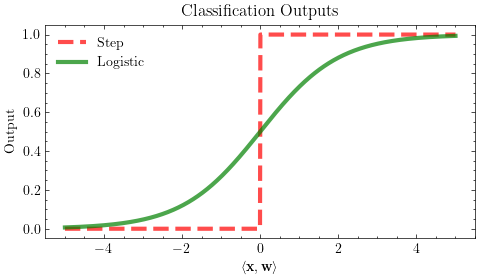

In [10]:
import numpy as np
import matplotlib.pyplot as plt

plt.figure(figsize=(5, 3))
X = np.linspace(-5, 5, 1000).reshape(-1, 1)
ys = {}

ys['Step'] = np.where(X > 0, 1, 0)  # Step function
ys['Logistic'] = 1 / (1 + np.exp(-X))  # Logistic function

colors = ['red', 'green']
linestyles = ['--', '-']
for idx, (label, y) in enumerate(ys.items()):
    plt.plot(X, y, label=label, linewidth=3, alpha=0.7, zorder=1, linestyle=linestyles[idx], color=colors[idx])

plt.legend()
plt.title('Classification Outputs')
plt.xlabel(r'$\langle \mathbf{x}, \mathbf{w} \rangle$')
plt.ylabel(r'Output')
plt.tight_layout()
plt.savefig('images/classification_outputs.svg', bbox_inches='tight', dpi=300)

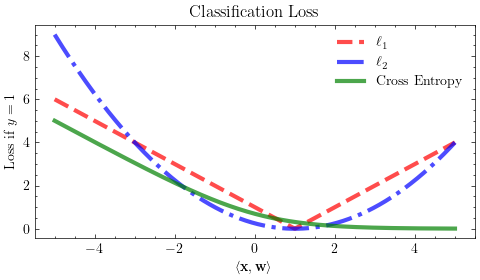

In [11]:
import numpy as np
import matplotlib.pyplot as plt

plt.figure(figsize=(5, 3))
X = np.linspace(-5, 5, 1000).reshape(-1, 1)
ys = {}

ys[r'$\ell_1$'] = np.abs(X - 1)
ys[r'$\ell_2$'] =  (X-1)**2 /4 # Squared loss
ys['Cross Entropy'] = -np.log(1 / (1 + np.exp(-X)))  # Logistic function

colors = ['red', 'blue', 'green']
linestyles = ['--', '-.', '-']
for idx, (label, y) in enumerate(ys.items()):
    plt.plot(X, y, label=label, linewidth=3, alpha=0.7, zorder=1, linestyle=linestyles[idx], color=colors[idx])

plt.legend()
plt.title('Classification Loss')
plt.xlabel(r'$\langle \mathbf{x}, \mathbf{w} \rangle$')
plt.ylabel(r'Loss if $y=1$')
plt.tight_layout()
plt.savefig('images/classification_loss.svg', bbox_inches='tight', dpi=300)

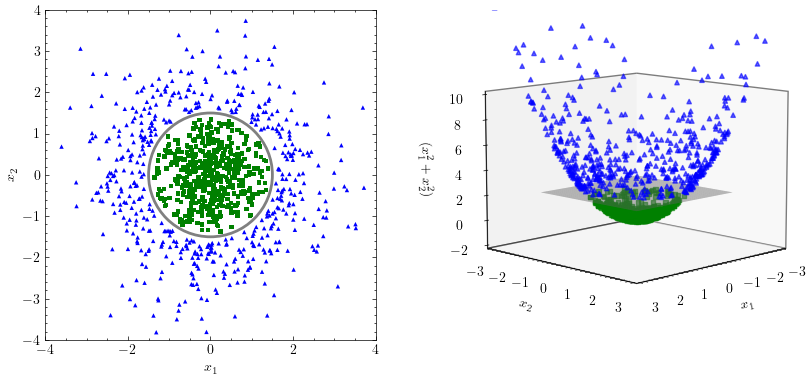

In [12]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Set seed and generate balanced data
np.random.seed(42)
n = 1000

# Positive class: inside circle (radius < 1.5)
pos = np.random.normal(0, 0.8, size=(n * 2, 2))
r_pos = np.linalg.norm(pos, axis=1)
pos = pos[r_pos < 1.4][:n // 2]

# Negative class: just outside circle (radius > 1.7)
neg = np.random.normal(0, 1.2, size=(n * 2, 2))
r_neg = np.linalg.norm(neg, axis=1)
neg = neg[r_neg > 1.6][:len(pos)]

# Combine
X = np.vstack([pos, neg])
y = np.hstack([np.ones(len(pos)), np.zeros(len(neg))])

# Colors
colors = np.array(['blue', 'red'])
marker_size = 10

# Create figure
fig = plt.figure(figsize=(9, 4))

# --- 2D plot ---
ax1 = fig.add_subplot(1, 2, 1)
ax1.scatter(X[y == 0, 0], X[y == 0, 1], s=marker_size, c='blue', marker='^', edgecolors='none', label='Negative')
ax1.scatter(X[y == 1, 0], X[y == 1, 1], s=marker_size, c='green', marker='s', edgecolors='none', label='Positive')
# Decision boundary
circle = plt.Circle((0, 0), 1.5, edgecolor='gray', fill=False, linewidth=2)
ax1.add_artist(circle)

# Axis settings
ax1.set_xlim(-4, 4)
ax1.set_ylim(-4, 4)
ax1.set_aspect('equal')
#ax1.set_title("Input Space")
ax1.set_xlabel('$x_1$')
ax1.set_ylabel('$x_2$')
ax1.tick_params(left=True, bottom=True)
for spine in ax1.spines.values():
    spine.set_visible(True)

# --- 3D plot ---
ax2 = fig.add_subplot(1, 2, 2, projection='3d')

# Feature transformation: z = - (x1^2 + x2^2)
X3 = np.sum(X**2, axis=1)
X_3d = np.hstack([X, X3[:, np.newaxis]])

ax2.scatter(X_3d[y == 0, 0], X_3d[y == 0, 1], X_3d[y == 0, 2],
            c='blue', s=marker_size, marker='^', label='Negative', alpha=0.6)
ax2.scatter(X_3d[y == 1, 0], X_3d[y == 1, 1], X_3d[y == 1, 2],
            c='green', s=marker_size, marker='s', label='Positive', alpha=0.6)


# Separating plane: z = -2.25
x1_range = np.linspace(-2, 2, 50)
x2_range = np.linspace(-2, 2, 50)
x1_grid, x2_grid = np.meshgrid(x1_range, x2_range)
z_plane = 2.25 * np.ones_like(x1_grid)

ax2.plot_surface(x1_grid, x2_grid, z_plane, color='grey', alpha=0.5, edgecolor='none')

# View and axis cleanup
ax2.view_init(elev=25, azim=135)
ax2.set_xlim(-4, 4)
ax2.set_ylim(-4, 4)
ax2.set_zlim(-20, 2)
#ax2.set_title("Transformed Feature Space")
ax2.set_xlabel("$x_1$")
ax2.set_ylabel("$x_2$")
ax2.set_zlabel(r"$(x_1^2 + x_2^2)$")
ax2.grid(False)

# Adjust view and axis limits for a pointed cone effect
ax2.view_init(elev=10, azim=45)
ax2.set_xlim(-3, 3)
ax2.set_ylim(-3, 3)
ax2.set_zlim(-2, 10)  # Compress vertical scale to make cone sharper

# Final layout adjustments
# Set white background and black cube lines for 3D plot
ax2.set_facecolor('white')
ax2.xaxis.pane.set_edgecolor('black')
ax2.yaxis.pane.set_edgecolor('black')
ax2.zaxis.pane.set_edgecolor('black')

plt.tight_layout()
plt.savefig('images/classification_transformation.svg', dpi=300, bbox_inches='tight')
plt.show()


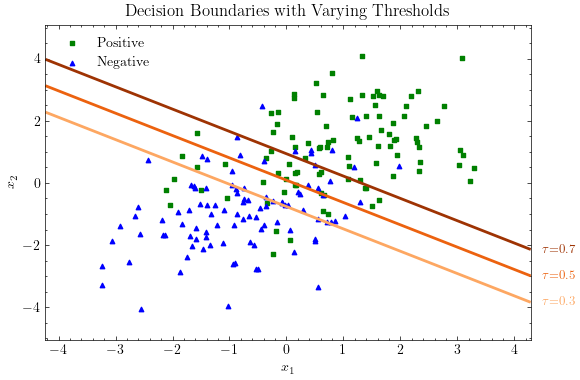

In [13]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression

# 1. Generate overlapping data
np.random.seed(0)
n = 200
mean_pos = [1, 1]
mean_neg = [-1, -1]
cov = [[1.5, 0.5], [0.5, 1.5]]

X_pos = np.random.multivariate_normal(mean_pos, cov, size=n//2)
X_neg = np.random.multivariate_normal(mean_neg, cov, size=n//2)
X = np.vstack((X_pos, X_neg))
y = np.hstack((np.ones(n//2), np.zeros(n//2)))

# 2. Fit logistic regression
clf = LogisticRegression()
clf.fit(X, y)

# 3. Create meshgrid
x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 400),
                     np.linspace(y_min, y_max, 400))
grid = np.c_[xx.ravel(), yy.ravel()]
probs = clf.predict_proba(grid)[:, 1].reshape(xx.shape)

# 4. Plot
fig, ax = plt.subplots(figsize=(6, 4))

# Scatter data points
ax.scatter(X[y == 1, 0], X[y == 1, 1], c='green', s=10, marker='s', label='Positive')
ax.scatter(X[y == 0, 0], X[y == 0, 1], c='blue', s=10, marker='^', label='Negative')


# Thresholds and colors
thresholds = [0.3, 0.5, 0.7]
import matplotlib
oranges = matplotlib.colormaps.get_cmap('Oranges')
colors = [oranges(i) for i in [0.4, 0.65, 0.9]] 

for tau, color in zip(thresholds, colors):
    CS = ax.contour(xx, yy, probs, levels=[tau], colors=[color], linewidths=2)
    
    # If there's a contour segment, label it manually
    if len(CS.allsegs[0]) > 0:
        seg = CS.allsegs[0][0]
        if len(seg) > 0:
            # Pick the right-most point (max x)
            x_text, y_text = seg[np.argmax(seg[:, 0])]
            ax.text(x_text + 0.2, y_text, fr'$\tau$={tau:.1f}',
                    color=color, fontsize=9, ha='left', va='center',
                    bbox=dict(boxstyle='round,pad=0.2', fc='white', ec='none', alpha=0.7))


# Final formatting
ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)
ax.set_xlabel('$x_1$')
ax.set_ylabel('$x_2$')
ax.legend()
ax.set_title("Decision Boundaries with Varying Thresholds")
plt.tight_layout()
plt.savefig('images/classification_boundaries.svg', dpi=300, bbox_inches='tight')
plt.show()


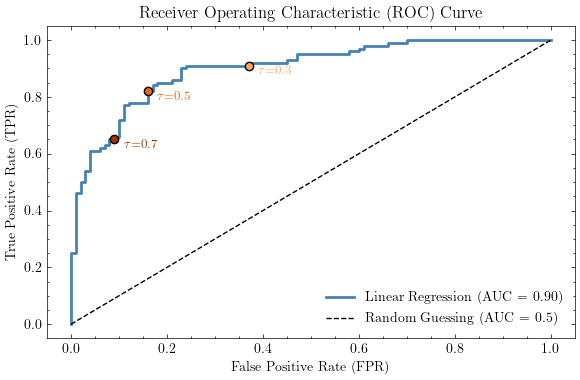

In [14]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_curve, roc_auc_score

# --- 1. Generate overlapping data ---
np.random.seed(0)
n = 200
mean_pos = [1, 1]
mean_neg = [-1, -1]
cov = [[1.5, 0.5], [0.5, 1.5]]

X_pos = np.random.multivariate_normal(mean_pos, cov, size=n//2)
X_neg = np.random.multivariate_normal(mean_neg, cov, size=n//2)
X = np.vstack((X_pos, X_neg))
y = np.hstack((np.ones(n//2), np.zeros(n//2)))

# --- 2. Fit logistic regression ---
clf = LogisticRegression()
clf.fit(X, y)
probs = clf.predict_proba(X)[:, 1]

# --- 3. Compute ROC curve and AUC ---
fpr, tpr, thresholds = roc_curve(y, probs)
auc = roc_auc_score(y, probs)

# --- 4. Plot ROC curve ---
plt.figure(figsize=(6, 4))
plt.plot(fpr, tpr, label=f"Linear Regression (AUC = {auc:.2f})", color='steelblue', linewidth=2)
plt.plot([0, 1], [0, 1], 'k--', linewidth=1, label='Random Guessing (AUC = 0.5)')

# --- 5. Highlight specific τ values ---
tau_values = [0.3, 0.5, 0.7]
import matplotlib
oranges = matplotlib.colormaps.get_cmap('Oranges')
colors = [oranges(i) for i in [0.4, 0.65, 0.9]] 

for tau, color in zip(tau_values, colors):
    # Find closest index in thresholds array
    idx = np.argmin(np.abs(thresholds - tau))
    plt.scatter(fpr[idx], tpr[idx], color=color, edgecolor='black', zorder=5)
    plt.text(fpr[idx]+0.02, tpr[idx]-0.02, fr'$\tau$={tau}', fontsize=9, color=color, verticalalignment='center')

# --- 6. Format plot ---
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.tight_layout()

plt.savefig('images/classification_roc.svg', dpi=300, bbox_inches='tight')
plt.show()

## Support Vector Machines

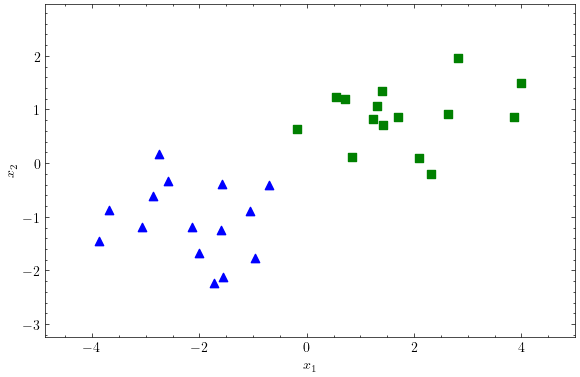

In [15]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
import matplotlib

# ==== 1. Generate *linearly separable* data ====
seed = 42        # change seed to get different random draws
np.random.seed(seed)

n = 30
mean_pos = [ 1,  1]
mean_neg = [-1, -1]
cov = [[0.4, 0.0],   # tight, nearly spherical clusters => separable
       [0.0, 0.4]]

X_pos = np.random.multivariate_normal(mean_pos, cov, size=n//2)
X_neg = np.random.multivariate_normal(mean_neg, cov, size=n//2)
X = np.vstack((X_pos, X_neg))
y = np.hstack((np.ones(n//2), np.zeros(n//2)))

# Stretch x so data width : height ≈ 6 : 4  (i.e., multiply by 1.5)
stretch = 6 / 3  # 1.5
X[:, 0] *= stretch

# ==== 2. Fit logistic regression ====
clf = LogisticRegression(max_iter=1000)
clf.fit(X, y)

# ==== 3. Create meshgrid ====
x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 400),
                     np.linspace(y_min, y_max, 400))
grid = np.c_[xx.ravel(), yy.ravel()]
probs = clf.predict_proba(grid)[:, 1].reshape(xx.shape)

# ==== 4. Plot ====
fig, ax = plt.subplots(figsize=(6, 4))

# Scatter data points — match your style
ax.scatter(X[y == 1, 0], X[y == 1, 1],
           c='green', marker='s', label='Positive')
ax.scatter(X[y == 0, 0], X[y == 0, 1],
           c='blue', marker='^', label='Negative')

# Final formatting
ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)
ax.set_xlabel('$x_1$')
ax.set_ylabel('$x_2$')
#ax.legend()
#ax.set_title("Linearly Separable Data")
ax.set_aspect('equal')
plt.tight_layout()

# Save & show
plt.savefig('images/svm_data.svg', dpi=300, bbox_inches='tight')

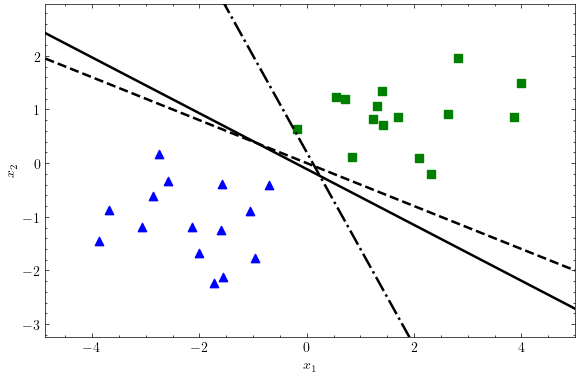

In [16]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.svm import SVC

# ==== 1. Generate *linearly separable* data ====
seed = 42
np.random.seed(seed)

n = 30
mean_pos = [1, 1]
mean_neg = [-1, -1]
cov = [[0.4, 0.0], [0.0, 0.4]]

X_pos = np.random.multivariate_normal(mean_pos, cov, size=n//2)
X_neg = np.random.multivariate_normal(mean_neg, cov, size=n//2)
X = np.vstack((X_pos, X_neg))
y = np.hstack((np.ones(n//2), np.zeros(n//2)))

# Stretch x so data width : height ≈ 6 : 4  (i.e., multiply by 1.5)
stretch = 6 / 3  # 1.5
X[:, 0] *= stretch

# ==== 2. Fit SVM with linear kernel ====
clf = SVC(kernel='linear', C=1e5)  # large C for hard-margin behavior
clf.fit(X, y)

# ==== 3. Create meshgrid for plotting (optional) ====
x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 400),
                     np.linspace(y_min, y_max, 400))

# ==== 4. Plot ====
fig, ax = plt.subplots(figsize=(6, 4))

# Scatter data points
ax.scatter(X[y == 1, 0], X[y == 1, 1], c='green', marker='s', label='Positive')
ax.scatter(X[y == 0, 0], X[y == 0, 1], c='blue', marker='^', label='Negative')

# ==== 5. Add three different (non-parallel) separating hyperplanes ====
def plot_separator(ax, slope, intercept, style, color, label):
    x_vals = np.linspace(x_min, x_max, 200)
    y_vals = slope * x_vals + intercept
    ax.plot(x_vals, y_vals, style, color=color, linewidth=1.8, label=label)

# Line 1: SVM decision boundary (maximum margin)
w = clf.coef_[0]
intercept_svm = clf.intercept_[0]
slope_svm = -w[0] / w[1]
intercept_line = -intercept_svm / w[1]
plot_separator(ax, slope_svm, intercept_line, '-', 'black', 'Separator 1 (SVM)')

# Line 2: custom separator with small margin, different slope
plot_separator(ax, -0.4, 0, '--', 'black', 'Separator 2 (Small Margin)')

# Line 3: another custom separator with small margin, different slope
plot_separator(ax, -1.8, 0.2, '-.', 'black', 'Separator 3 (Small Margin)')

# ==== Final formatting ====
ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)
ax.set_xlabel('$x_1$')
ax.set_ylabel('$x_2$')
ax.set_aspect('equal')
plt.tight_layout()

# Save and show
plt.savefig('images/svm_possible_lines.svg', dpi=300, bbox_inches='tight')
plt.show()


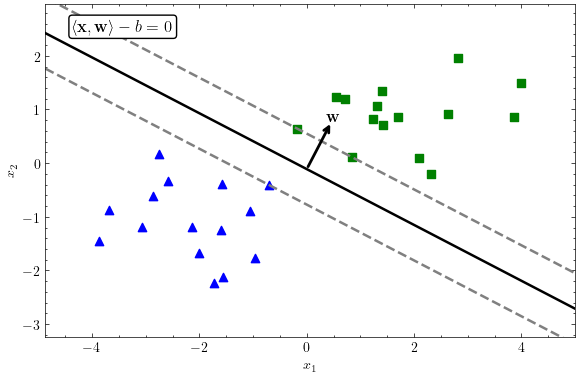

In [17]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.svm import SVC

# ==== 1. Generate *linearly separable* data ====
seed = 42
np.random.seed(seed)

n = 30
mean_pos = [1, 1]
mean_neg = [-1, -1]
cov = [[0.4, 0.0], [0.0, 0.4]]


X_pos = np.random.multivariate_normal(mean_pos, cov, size=n//2)
X_neg = np.random.multivariate_normal(mean_neg, cov, size=n//2)
X = np.vstack((X_pos, X_neg))
y = np.hstack((np.ones(n//2), np.zeros(n//2)))

# Stretch x so data width : height ≈ 6 : 4  (i.e., multiply by 1.5)
stretch = 6 / 3  # 1.5
X[:, 0] *= stretch

# ==== 2. Fit SVM with linear kernel ====
clf = SVC(kernel='linear', C=1e5)  # large C for hard-margin behavior
clf.fit(X, y)

# ==== 3. Create meshgrid for plotting (optional) ====
x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 400),
                     np.linspace(y_min, y_max, 400))

# ==== 4. Plot ====
fig, ax = plt.subplots(figsize=(6, 4))

# Scatter data points
ax.scatter(X[y == 1, 0], X[y == 1, 1], c='green', marker='s')
ax.scatter(X[y == 0, 0], X[y == 0, 1], c='blue', marker='^')

# ==== 5. Add three different (non-parallel) separating hyperplanes ====
def plot_separator(ax, slope, intercept, style, color, label=""):
    x_vals = np.linspace(x_min, x_max, 200)
    y_vals = slope * x_vals + intercept
    ax.plot(x_vals, y_vals, style, color=color, linewidth=1.8, label=label)

# Line 1: SVM decision boundary (maximum margin)
w = clf.coef_[0]
intercept_svm = clf.intercept_[0]
slope_svm = -w[0] / w[1]
intercept_line = -intercept_svm / w[1]
margin = 1 / np.linalg.norm(w)
plot_separator(ax, slope_svm, intercept_line, '-', 'black')

ax.text(x_min + 0.5, y_max - 0.5,
        r'$\langle \mathbf{x}, \mathbf{w} \rangle - b = 0$',
        fontsize=12,
        bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.2'))

# Line 2 and 3: small-margin lines
# Correct: plot margin boundaries using (w · x + b = ±1)
# These yield: x2 = -(w0/w1) * x1 - (b ± 1)/w1

intercept_plus = -(intercept_svm - 1) / w[1]  # w·x + b = 1 ⇒ b - 1
intercept_minus = -(intercept_svm + 1) / w[1] # w·x + b = -1 ⇒ b + 1

plot_separator(ax, slope_svm, intercept_plus, '--', 'gray')
plot_separator(ax, slope_svm, intercept_minus, '--', 'gray')


# ==== 6. Draw normal vector w ====
# ==== Compute & draw the normal vector w ====
# w is the normal vector to the hyperplane
w = clf.coef_[0]
b = clf.intercept_[0]

# Unit vector in direction of w
w_unit = w / np.linalg.norm(w)

# Find a point (x0, x1) on the hyperplane
# We'll pick x = 0 and solve for x1 using the decision boundary equation:
# w0*x + w1*y + b = 0 → y = -(w0*x + b)/w1
x0 = 0
y0 = -(w[0] * x0 + b) / w[1]
start = np.array([x0, y0])
end = start + 1.0 * w_unit  # extend for visibility

# Draw arrow from the hyperplane in direction of w
ax.annotate('', xy=end, xytext=start,
            arrowprops=dict(arrowstyle='->', color='black', linewidth=2))
ax.text(end[0] - 0.1, end[1], r'$\mathbf{w}$', fontsize=12)


# ==== Final formatting ====
ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)
ax.set_xlabel('$x_1$')
ax.set_ylabel('$x_2$')
ax.set_aspect('equal') 
#ax.legend(loc='upper left', framealpha=1)
plt.tight_layout()

# Save and show
plt.savefig('images/svm_definition.svg', dpi=300, bbox_inches='tight')
plt.show()

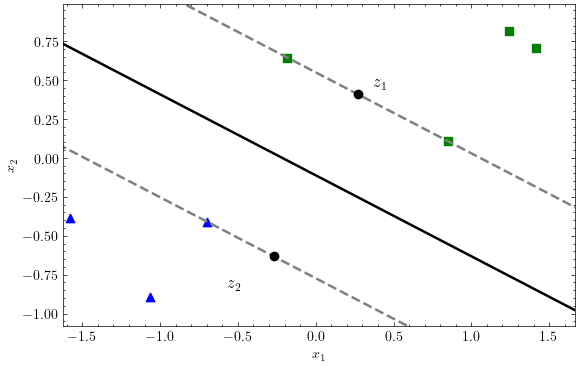

In [18]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.svm import SVC

# ==== 1. Generate *linearly separable* data ====
seed = 42
np.random.seed(seed)

n = 30
mean_pos = [1, 1]
mean_neg = [-1, -1]
cov = [[0.4, 0.0], [0.0, 0.4]]


X_pos = np.random.multivariate_normal(mean_pos, cov, size=n//2)
X_neg = np.random.multivariate_normal(mean_neg, cov, size=n//2)
X = np.vstack((X_pos, X_neg))
y = np.hstack((np.ones(n//2), np.zeros(n//2)))

# Stretch x so data width : height ≈ 6 : 4  (i.e., multiply by 1.5)
stretch = 6 / 3  # 1.5
X[:, 0] *= stretch

# ==== 2. Fit SVM with linear kernel ====
clf = SVC(kernel='linear', C=1e5)  # large C for hard-margin behavior
clf.fit(X, y)

# ==== 3. Create meshgrid for plotting (optional) ====
x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 400),
                     np.linspace(y_min, y_max, 400))

# ==== 4. Plot ====
fig, ax = plt.subplots(figsize=(6, 4))

# Scatter data points
ax.scatter(X[y == 1, 0], X[y == 1, 1], c='green', marker='s')
ax.scatter(X[y == 0, 0], X[y == 0, 1], c='blue', marker='^')

# ==== 5. Add three different (non-parallel) separating hyperplanes ====
def plot_separator(ax, slope, intercept, style, color, label=""):
    x_vals = np.linspace(x_min, x_max, 200)
    y_vals = slope * x_vals + intercept
    ax.plot(x_vals, y_vals, style, color=color, linewidth=1.8, label=label)

# Line 1: SVM decision boundary (maximum margin)
w = clf.coef_[0]
intercept_svm = clf.intercept_[0]
slope_svm = -w[0] / w[1]
intercept_line = -intercept_svm / w[1]
margin = 1 / np.linalg.norm(w)
plot_separator(ax, slope_svm, intercept_line, '-', 'black')

# Correct: plot margin boundaries using (w · x + b = ±1)
# These yield: x2 = -(w0/w1) * x1 - (b ± 1)/w1

intercept_plus = -(intercept_svm - 1) / w[1]  # w·x + b = 1 ⇒ b - 1
intercept_minus = -(intercept_svm + 1) / w[1] # w·x + b = -1 ⇒ b + 1

plot_separator(ax, slope_svm, intercept_plus, '--', 'gray')
plot_separator(ax, slope_svm, intercept_minus, '--', 'gray')


# ==== 6. Add z1 and z2 on margin boundaries ====

# Unit vector in direction of w (normal to boundary)

# Point on decision boundary (midpoint between margins)
# We can pick any x along the boundary; let's choose x = 0
x0 = 0
y0 = slope_svm * x0 + intercept_line
point_on_hyperplane = np.array([x0, y0])

# Compute z1 and z2 by moving along ±w_unit * margin
z1 = point_on_hyperplane - margin * w / np.linalg.norm(w)
z2 = point_on_hyperplane + margin * w/ np.linalg.norm(w)

# Plot z1 and z2
ax.plot(z1[0], z1[1], 'ko')  # black point
ax.plot(z2[0], z2[1], 'ko')

ax.text(z1[0] - 0.3, z1[1] - 0.2, r'$z_2$', fontsize=12)
ax.text(z2[0] + 0.1, z2[1] + 0.05, r'$z_1$', fontsize=12)


# ==== Final formatting ====
ax.set_xlim(x_min/3, x_max/3)
ax.set_ylim(y_min/3, y_max/3)
ax.set_xlabel('$x_1$')
ax.set_ylabel('$x_2$')
ax.set_aspect('equal') 
#ax.legend(loc='upper left', framealpha=1)
plt.tight_layout()

# Save and show
plt.savefig('images/svm_margin.svg', dpi=300, bbox_inches='tight')
plt.show()

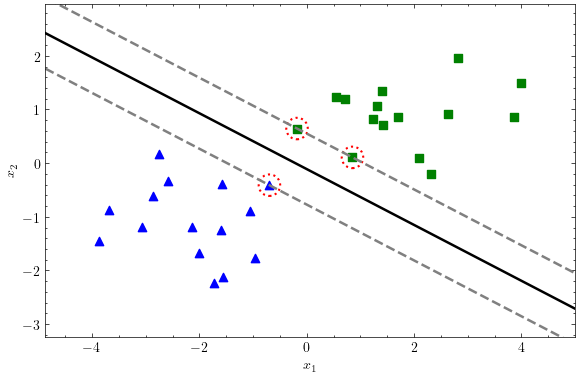

In [19]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.svm import SVC

# ==== 1. Generate *linearly separable* data ====
seed = 42
np.random.seed(seed)

n = 30
mean_pos = [1, 1]
mean_neg = [-1, -1]
cov = [[0.4, 0.0], [0.0, 0.4]]


X_pos = np.random.multivariate_normal(mean_pos, cov, size=n//2)
X_neg = np.random.multivariate_normal(mean_neg, cov, size=n//2)
X = np.vstack((X_pos, X_neg))
y = np.hstack((np.ones(n//2), np.zeros(n//2)))

# Stretch x so data width : height ≈ 6 : 4  (i.e., multiply by 1.5)
stretch = 6 / 3  # 1.5
X[:, 0] *= stretch

# ==== 2. Fit SVM with linear kernel ====
clf = SVC(kernel='linear', C=1e5)  # large C for hard-margin behavior
clf.fit(X, y)

# ==== 3. Create meshgrid for plotting (optional) ====
x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 400),
                     np.linspace(y_min, y_max, 400))

# ==== 4. Plot ====
fig, ax = plt.subplots(figsize=(6, 4))

# Scatter data points
ax.scatter(X[y == 1, 0], X[y == 1, 1], c='green', marker='s')
ax.scatter(X[y == 0, 0], X[y == 0, 1], c='blue', marker='^')

# ==== 5. Add three different (non-parallel) separating hyperplanes ====
def plot_separator(ax, slope, intercept, style, color, label=""):
    x_vals = np.linspace(x_min, x_max, 200)
    y_vals = slope * x_vals + intercept
    ax.plot(x_vals, y_vals, style, color=color, linewidth=1.8, label=label)

# Line 1: SVM decision boundary (maximum margin)
w = clf.coef_[0]
intercept_svm = clf.intercept_[0]
slope_svm = -w[0] / w[1]
intercept_line = -intercept_svm / w[1]
margin = 1 / np.linalg.norm(w)
plot_separator(ax, slope_svm, intercept_line, '-', 'black')

# Correct: plot margin boundaries using (w · x + b = ±1)
# These yield: x2 = -(w0/w1) * x1 - (b ± 1)/w1

intercept_plus = -(intercept_svm - 1) / w[1]  # w·x + b = 1 ⇒ b - 1
intercept_minus = -(intercept_svm + 1) / w[1] # w·x + b = -1 ⇒ b + 1

plot_separator(ax, slope_svm, intercept_plus, '--', 'gray')
plot_separator(ax, slope_svm, intercept_minus, '--', 'gray')

# ==== 6. Highlight support vectors with red dotted circles ====
support_vectors = clf.support_vectors_
for sv in support_vectors:
    circle = plt.Circle((sv[0], sv[1]), radius=0.2, edgecolor='red',
                        facecolor='none', linestyle=':', linewidth=1.5)
    ax.add_patch(circle)


# ==== Final formatting ====
ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)
ax.set_xlabel('$x_1$')
ax.set_ylabel('$x_2$')
ax.set_aspect('equal') 
#ax.legend(loc='upper left', framealpha=1)
plt.tight_layout()

# Save and show
plt.savefig('images/svm_supports.svg', dpi=300, bbox_inches='tight')
plt.show()

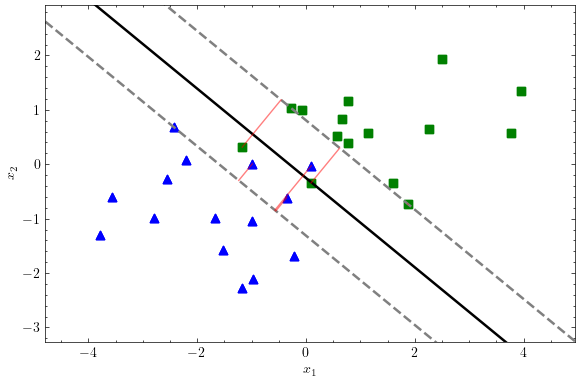

In [20]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.svm import SVC

# ==== 1. Generate *linearly separable* data ====
seed = 42
np.random.seed(seed)

n = 30
mean_pos = [.75, .75]
mean_neg = [-.75, -.75]
cov = [[0.6, 0.0], [0.0, 0.6]]


X_pos = np.random.multivariate_normal(mean_pos, cov, size=n//2)
X_neg = np.random.multivariate_normal(mean_neg, cov, size=n//2)
X = np.vstack((X_pos, X_neg))
y = np.hstack((np.ones(n//2), np.zeros(n//2)))

# Stretch x so data width : height ≈ 6 : 4  (i.e., multiply by 1.5)
stretch = 6 / 3  # 1.5
X[:, 0] *= stretch

# ==== 2. Fit SVM with linear kernel ====
clf = SVC(kernel='linear', C=1)  # large C for hard-margin behavior
clf.fit(X, y)

# ==== 3. Create meshgrid for plotting (optional) ====
x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 400),
                     np.linspace(y_min, y_max, 400))

# ==== 4. Plot ====
fig, ax = plt.subplots(figsize=(6, 4))

# Scatter data points
ax.scatter(X[y == 1, 0], X[y == 1, 1], c='green', marker='s')
ax.scatter(X[y == 0, 0], X[y == 0, 1], c='blue', marker='^')

# ==== 5. Add three different (non-parallel) separating hyperplanes ====
def plot_separator(ax, slope, intercept, style, color, label=""):
    x_vals = np.linspace(x_min, x_max, 200)
    y_vals = slope * x_vals + intercept
    ax.plot(x_vals, y_vals, style, color=color, linewidth=1.8, label=label)

# Line 1: SVM decision boundary (maximum margin)
w = clf.coef_[0]
intercept_svm = clf.intercept_[0]
slope_svm = -w[0] / w[1]
intercept_line = -intercept_svm / w[1]
margin = 1 / np.linalg.norm(w)
plot_separator(ax, slope_svm, intercept_line, '-', 'black')

# Correct: plot margin boundaries using (w · x + b = ±1)
# These yield: x2 = -(w0/w1) * x1 - (b ± 1)/w1

intercept_plus = -(intercept_svm - 1) / w[1]  # w·x + b = 1 ⇒ b - 1
intercept_minus = -(intercept_svm + 1) / w[1] # w·x + b = -1 ⇒ b + 1

plot_separator(ax, slope_svm, intercept_plus, '--', 'gray')
plot_separator(ax, slope_svm, intercept_minus, '--', 'gray')

# ==== 6. Draw red lines from misclassified points to correct margin ====
from numpy.linalg import norm

# Signed distance from the hyperplane
decision_values = clf.decision_function(X)

# Normalized w
w = clf.coef_[0]
w_unit = w / norm(w)

# Go through all points
for xi, yi, di in zip(X, y, decision_values):
    correct_margin = 1 if yi == 1 else -1
    if di * (2 * yi - 1) < 1:  # misclassified
        # Distance to move along w to reach the correct margin
        delta = (correct_margin - (np.dot(w, xi) + intercept_svm)) / norm(w)**2
        projection = xi + delta * w  # point on correct margin
        ax.plot([xi[0], projection[0]], [xi[1], projection[1]], 'r-', linewidth=1, alpha=0.5)

# Scatter data points
ax.scatter(X[y == 1, 0], X[y == 1, 1], c='green', marker='s')
ax.scatter(X[y == 0, 0], X[y == 0, 1], c='blue', marker='^')

# ==== Final formatting ====
ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)
ax.set_xlabel('$x_1$')
ax.set_ylabel('$x_2$')
ax.set_aspect('equal') 
#ax.legend(loc='upper left', framealpha=1)
plt.tight_layout()

# Save and show
plt.savefig('images/svm_soft.svg', dpi=300, bbox_inches='tight')
plt.show()

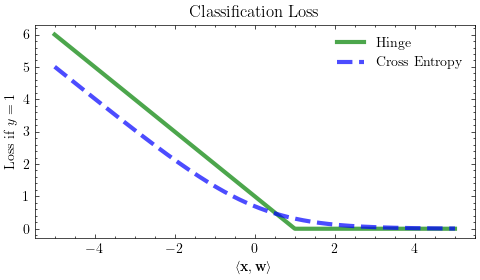

In [21]:
import numpy as np
import matplotlib.pyplot as plt

plt.figure(figsize=(5, 3))
X = np.linspace(-5, 5, 1000).reshape(-1, 1)
ys = {}


ys['Hinge'] = np.maximum((1-X), 0)
ys['Cross Entropy'] = -np.log(1 / (1 + np.exp(-X)))  # Logistic function


colors = ['green', 'blue']
linestyles = ['-', '--']
for idx, (label, y) in enumerate(ys.items()):
    plt.plot(X, y, label=label, linewidth=3, alpha=0.7, zorder=1, linestyle=linestyles[idx], color=colors[idx])

plt.legend()
plt.title('Classification Loss')
plt.xlabel(r'$\langle \mathbf{x}, \mathbf{w} \rangle$')
plt.ylabel(r'Loss if $y=1$')
plt.tight_layout()
plt.savefig('images/svm_loss.svg', bbox_inches='tight', dpi=300)

## Kernel Methods

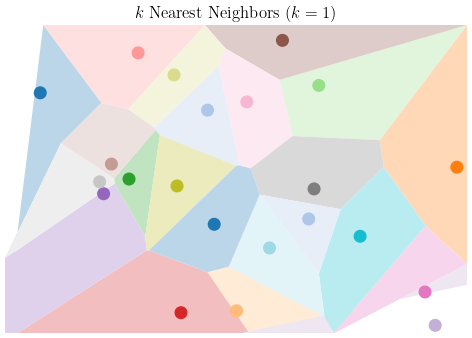

In [22]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import to_rgb
from scipy.spatial import Voronoi

# Helper to convert infinite Voronoi regions into finite polygons (clipped to a bounding box)
def voronoi_finite_polygons_2d(vor, radius=None):
    if vor.points.shape[1] != 2:
        raise ValueError("Requires 2D input")

    new_regions = []
    new_vertices = vor.vertices.tolist()

    center = vor.points.mean(axis=0)
    if radius is None:
        radius = vor.points.ptp().max()*2

    # Construct a map containing all ridges for a given point
    all_ridges = {}
    for (p1, p2), (v1, v2) in zip(vor.ridge_points, vor.ridge_vertices):
        all_ridges.setdefault(p1, []).append((p2, v1, v2))
        all_ridges.setdefault(p2, []).append((p1, v1, v2))

    # Reconstruct infinite regions
    for p1, region_index in enumerate(vor.point_region):
        vertices = vor.regions[region_index]
        if all(v >= 0 for v in vertices):
            # Finite region
            new_regions.append(vertices)
            continue

        # Rebuild a finite region
        ridges = all_ridges[p1]
        new_region = [v for v in vertices if v >= 0]

        for p2, v1, v2 in ridges:
            if v1 >= 0 and v2 >= 0:
                continue
            # Compute the missing endpoint of an infinite ridge
            t = vor.points[p2] - vor.points[p1]  # tangent
            t /= np.linalg.norm(t)
            n = np.array([-t[1], t[0]])  # normal

            midpoint = vor.points[[p1, p2]].mean(axis=0)
            direction = np.sign(np.dot(midpoint - center, n)) * n
            far_point = vor.vertices[v1 if v1 >= 0 else v2] + direction * radius

            new_vertices.append(far_point.tolist())
            new_region.append(len(new_vertices) - 1)

        # Sort region vertices counterclockwise
        vs = np.asarray([new_vertices[v] for v in new_region])
        c = vs.mean(axis=0)
        angles = np.arctan2(vs[:,1] - c[1], vs[:,0] - c[0])
        new_region = [v for _, v in sorted(zip(angles, new_region))]

        new_regions.append(new_region)

    return new_regions, np.asarray(new_vertices)

# Generate points

W, H = 6, 4
np.random.seed(7)
n_points = 22
pts = np.random.rand(n_points, 2)
pts[:,0] *= W
pts[:,1] *= H

# Build Voronoi
vor = Voronoi(pts)
regions, vertices = voronoi_finite_polygons_2d(vor, radius=2)

# Colors
cmap = plt.get_cmap("tab20")
base_colors = [cmap(i % cmap.N) for i in range(n_points)]

def lighten(color, factor=0.65):
    r, g, b = to_rgb(color)
    r = r + (1 - r) * factor
    g = g + (1 - g) * factor
    b = b + (1 - b) * factor
    return (r, g, b)

fig, ax = plt.subplots(figsize=(6, 4))

# Draw regions with light fill and no line shading
for i, region in enumerate(regions):
    polygon = vertices[region]
    polygon[:,0] = np.clip(polygon[:,0], 0, W)
    polygon[:,1] = np.clip(polygon[:,1], 0, H)
    ax.fill(
        polygon[:,0], polygon[:,1],
        facecolor=lighten(base_colors[i], 0.7),
        edgecolor='none'
    )

# Plot points with no black edge
ax.scatter(pts[:,0], pts[:,1], s=70, c=base_colors, zorder=5)

ax.set_xlim(0, W)
ax.set_ylim(0, H)
ax.set_aspect("equal", adjustable="box")
ax.set_xticks([])
ax.set_yticks([])
ax.set_axis_off()
ax.set_title("$k$ Nearest Neighbors ($k=1$)")

plt.savefig("images/kernel_knn.svg", dpi=300)

## Autoencoders

In [23]:
from PIL import Image, ImageOps

img = Image.open("images/cmc_seal_rgb.png").convert("L")
img_arr = np.array(img) / 255
cmc_red = np.array([139, 39, 52])


In [24]:
# scipy linalg
import scipy.linalg
U, s, Vh = scipy.linalg.svd(img_arr, full_matrices=False)
rank = len(s)

def build_k_approx(k):
    return (U[:, :k] * s[:k]) @ Vh[:k, :]


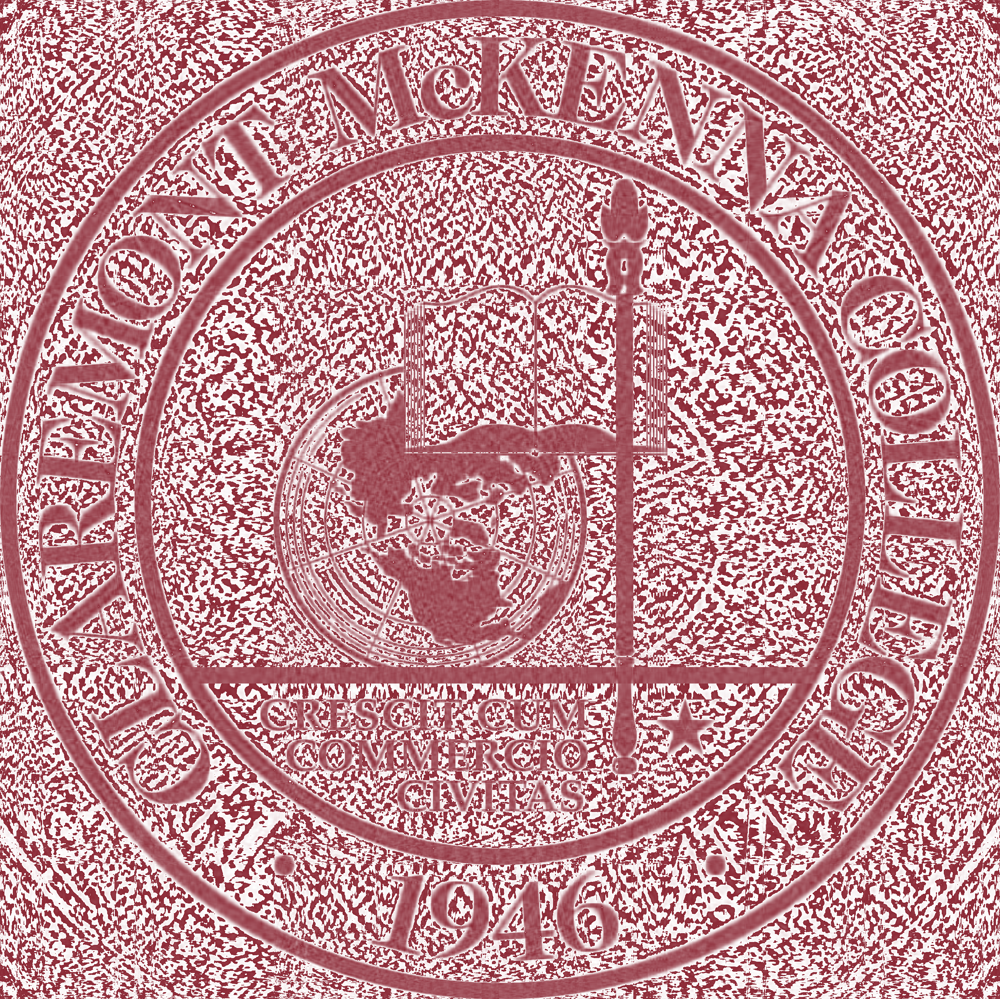

In [25]:
approx = build_k_approx(100)
gray_image = Image.fromarray((approx * 255).astype(np.uint8), mode="L")
red_image = ImageOps.colorize(gray_image, black=cmc_red, white="white")
red_image

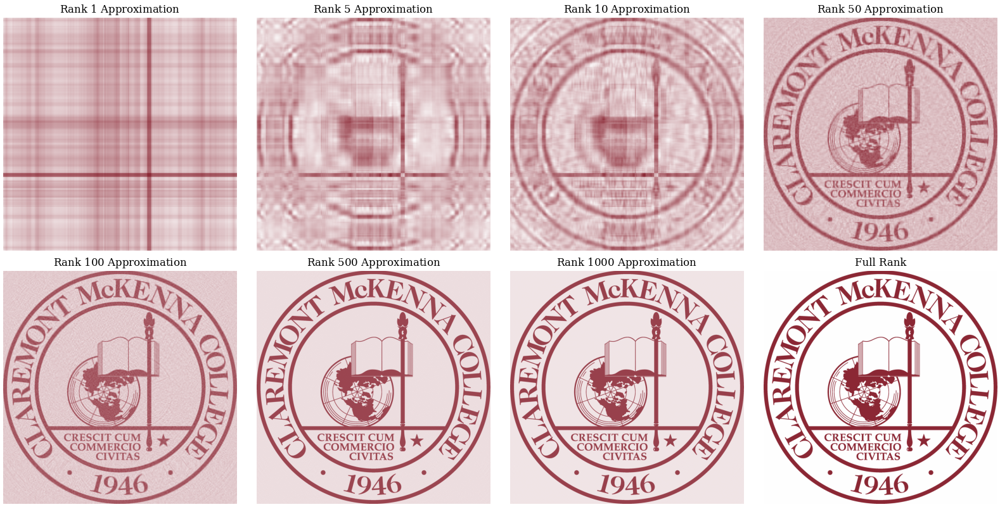

In [26]:
import numpy as np
import matplotlib as mpl
mpl.rcParams['text.usetex'] = False  # avoid LaTeX dependency
import matplotlib.pyplot as plt
from PIL import Image, ImageOps

# If not already defined:
# cmc_red = (152, 26, 49)

def to_red_pil(a, low=(152, 26, 49), high="white"):
    """Map a grayscale array [0,1] to a red-toned PIL image."""
    a = np.asarray(a, dtype=float)
    # Ensure it's in [0,1]
    if a.max() > 1.0 or a.min() < 0.0:
        a = (a - a.min()) / (a.max() - a.min() + 1e-12)
    gray = Image.fromarray((a * 255).astype(np.uint8), mode="L")
    return ImageOps.colorize(gray, black=low, white=high)

# Your desired ranks
desired = [1, 5, 10, 50, 100, 500, 1000]

# Get a sample to infer full rank (min(H, W))
# If you already have `approx` from build_k_approx(100), you can use that:
sample = build_k_approx(1)
full_k = min(sample.shape)

# Cap any requested ranks to full_k to avoid errors
ranks = [min(k, full_k) for k in desired]
# Add "full rank" explicitly at the end
ranks_with_full = ranks + [full_k]

# Make subplots
n = len(ranks_with_full)
cols = 4
rows = int(np.ceil(n / cols))
fig, axes = plt.subplots(rows, cols, figsize=(4*cols, 4*rows), constrained_layout=True)
axes = np.ravel(axes)

for ax, k in zip(axes, ranks_with_full):
    arr = build_k_approx(k)
    red_img = to_red_pil(arr, low=cmc_red, high="white")
    ax.imshow(red_img)
    ax.set_title(rf"Rank ${k}$ Approximation" if k != full_k else f"Full Rank")
    ax.axis("off")


# Hide any unused axes
for ax in axes[n:]:
    ax.axis("off")

plt.savefig("images/pca_approximations.svg")

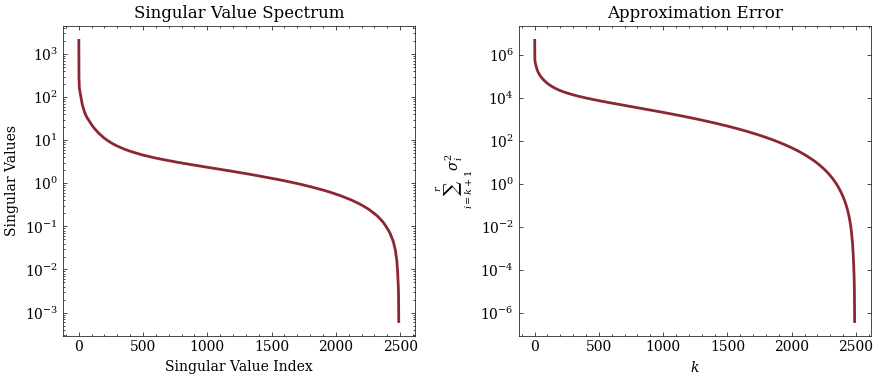

In [27]:
import numpy as np
import matplotlib.pyplot as plt

# Example data: replace with your singular values array
# s should be sorted descending from your SVD
# U, s, Vt = np.linalg.svd(A)
rank = len(s)

# Convert cmc_red (0–255 tuple) to Matplotlib's 0–1 float
cmc_red_norm = tuple(np.array(cmc_red) / 255)

# Compute approximation error: error[k] = sum_{i=k}^rank σᵢ²
# Note: If you want k starting from 1, adjust indexing below
errors = [np.sum(s[k:]**2) for k in range(rank)]

# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(9, 4))

# ---- Left subplot: Singular Value Spectrum ----
axes[0].plot(range(1, rank+1), s, color=cmc_red_norm, linewidth=2)
axes[0].set_yscale("log")
axes[0].set_xlabel("Singular Value Index")
axes[0].set_ylabel("Singular Values")
axes[0].set_title("Singular Value Spectrum")

# ---- Right subplot: Approximation Error ----
axes[1].plot(range(1, rank+1), errors, color=cmc_red_norm, linewidth=2)
axes[1].set_yscale("log")
axes[1].set_xlabel(r"$k$")
axes[1].set_ylabel(r"$\sum_{i=k+1}^{r} \sigma_i^2$")
axes[1].set_title("Approximation Error")

plt.tight_layout()
plt.savefig("images/pca_spectrum.svg")


## Concentration Inequalities

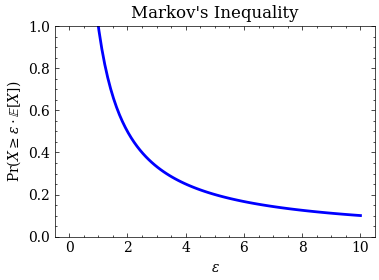

In [28]:
fig, ax = plt.subplots(figsize=(4, 3))

t = np.linspace(.01, 10, 100)
ax.set_ylim(bottom=0,top=1)
ax.plot(t, 1/t, linewidth=2, color='blue')
ax.set_xlabel(r"$\epsilon$")
ax.set_ylabel(r"$\Pr(X \geq \epsilon \cdot \mathbb{E}[X])$")
ax.set_title("Markov's Inequality")
plt.tight_layout()
plt.savefig("images/concentration_markov.svg", dpi=300, bbox_inches='tight')

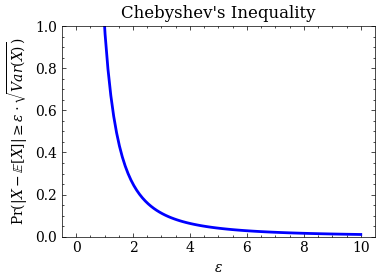

In [33]:
fig, ax = plt.subplots(figsize=(4, 3))

ax.plot(t, 1/t**2, linewidth=2, color='blue')

ax.set_xlabel(r"$\epsilon$")
ax.set_ylabel(r"$\Pr(|X-\mathbb{E}[X]| \geq \epsilon \cdot \sqrt{Var(X)})$")
ax.set_ylim(bottom=0,top=1)
ax.set_title("Chebyshev's Inequality")
plt.tight_layout()
plt.savefig("images/concentration_chebyshev.svg", dpi=300, bbox_inches='tight')

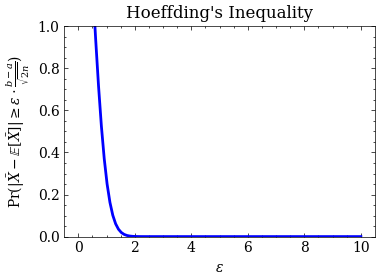

In [34]:
fig, ax = plt.subplots(figsize=(4, 3))

ax.plot(t, 2*np.exp(-2*t**2), linewidth=2, color='blue')

ax.set_xlabel(r"$\epsilon$")
ax.set_ylabel(r"$\Pr(|\bar{X}-\mathbb{E}[\bar{X}]| \geq \epsilon \cdot \frac{b-a}{\sqrt{2n}})$")
ax.set_ylim(bottom=0,top=1)
ax.set_title("Hoeffding's Inequality")
plt.tight_layout()
plt.savefig("images/concentration_hoeffding.svg", dpi=300, bbox_inches='tight')